#### Домашнее задание «Элементарные методы анализа временных рядов»  

Взять из прошлого домашнего задания ряд (в двух вариантах - стационарный и нет) и приблизить оба эти варианта моделями из класса MA. Оценить качество и прислать соображения почему была выбрана та или иная модель

In [1]:
import pandas as pd
import numpy as np
from statsmodels.tsa.stattools import adfuller
import statsmodels.api as sm
import statsmodels.tsa.api as smt
from statsmodels.tsa.stattools import adfuller
import matplotlib.pyplot as plt
from scipy.stats import boxcox
%matplotlib inline

import warnings
warnings.filterwarnings('ignore')

In [2]:
international_airline_passengers = pd.read_csv(r'C:\Users\Urmas\Desktop\Digital\НЕТОЛОГИЯ. ПРОФЕССИЯ DATA SCIENTIST\Временные ряды\Знакомство с временными рядами\Series\international-airline-passengers.csv')

In [3]:
y = pd.Series(international_airline_passengers['Count'])

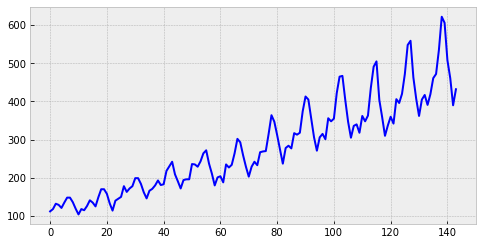

In [4]:
with plt.style.context('bmh'):
    plt.figure(figsize=(8, 4))
    plt.plot(y, color='blue')
    plt.show()

In [5]:
def test_stationarity(timeseries):    # сам тест Дики-Фуллера
    print('Results of Dickey-Fuller Test:')
    dftest = adfuller(timeseries, autolag='AIC')
    dfoutput = pd.Series(dftest[0:4], index=['Test Statistic', 'p-value', '#Lags Used', 'Number of Observations Used'])
    for [key, value] in dftest[4].items():
        dfoutput['Critical Value (%s)' % key] = value
    print(dfoutput)

def tsplot(y, lags=None, figsize=(10, 4), style='bmh'):   # отрисовка графика, ACF, PACF
    test_stationarity(y)
    if not isinstance(y, pd.Series):
        y = pd.Series(y)
    with plt.style.context(style):
        plt.figure(figsize=figsize)
        layout = (4, 1)
        ts_ax = plt.subplot2grid(layout, (0, 0), rowspan=2)
        acf_ax = plt.subplot2grid(layout, (2, 0))
        pacf_ax = plt.subplot2grid(layout, (3, 0))

        y.plot(ax=ts_ax, color='blue', label='Or')
        ts_ax.set_title('Original')

        smt.graphics.plot_acf(y, lags=lags, ax=acf_ax, alpha=0.05)
        smt.graphics.plot_pacf(y, lags=lags, ax=pacf_ax, alpha=0.05)

        plt.tight_layout()
    return

Results of Dickey-Fuller Test:
Test Statistic                   0.815369
p-value                          0.991880
#Lags Used                      13.000000
Number of Observations Used    130.000000
Critical Value (1%)             -3.481682
Critical Value (5%)             -2.884042
Critical Value (10%)            -2.578770
dtype: float64


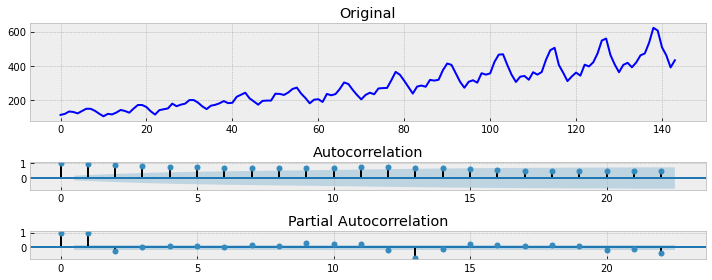

In [6]:
tsplot(y)

Имеем нестационарный ряд y, с p-value=0.991880, разной дисперсией, трендом и сезоном

Results of Dickey-Fuller Test:
Test Statistic                  -4.068453
p-value                          0.001092
#Lags Used                      13.000000
Number of Observations Used    103.000000
Critical Value (1%)             -3.495493
Critical Value (5%)             -2.890037
Critical Value (10%)            -2.581971
dtype: float64


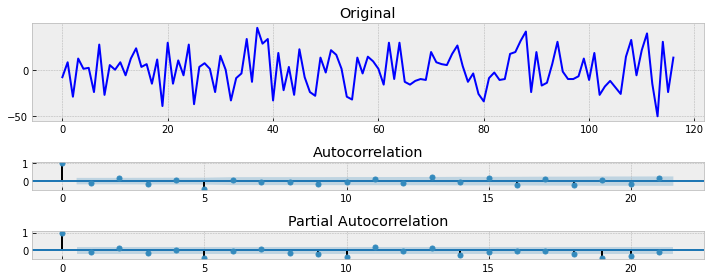

In [7]:
y2 = boxcox(y, 1)
y2 = np.diff(y2, 1)
y2 = y2[12:] - y2[:-12]
y2 = y2[9:] - y2[:-9]
y2 = y2[5:] - y2[:-5]
tsplot(y2)

Имеем относительно стационарный ряд y2, с p-value=0.001092, немного разной дисперсией, без тренда и выраженной сезонности

In [8]:
y2 = pd.Series(y2)

Применим к ВР y, y2 модели из класса МА

#### Скользящее среднее

In [9]:
def moving_average(series, n):
    if not isinstance(series, pd.Series):
        series = pd.Series(series)
    return series.rolling(n).mean()

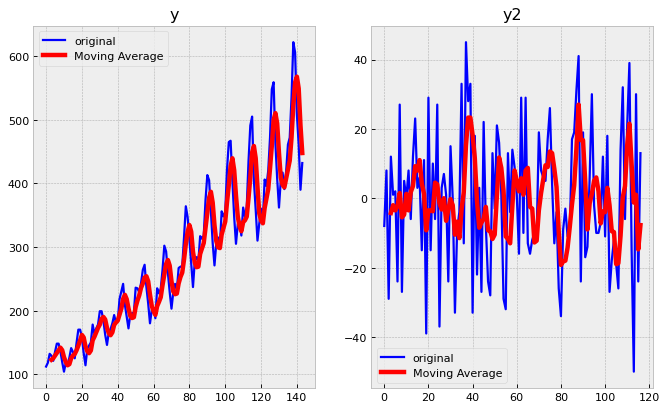

In [10]:
ser = moving_average(y, 4)
ser2 = moving_average(y2, 4)

with plt.style.context('bmh'):
    fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(10, 6), dpi=80)
    
    ax1.plot(y, color='blue',label='original')
    ax1.plot(ser, color='red', linewidth='4', label='Moving Average')
    ax1.legend()
    ax1.set_title('y')
    
    ax2.plot(y2, color='blue',label='original')
    ax2.plot(ser2, color='red', linewidth='4', label='Moving Average')
    ax2.legend()
    ax2.set_title('y2')
    

#### В зависимости от размера "окна" меняется сглаженность графика (нового ВР)

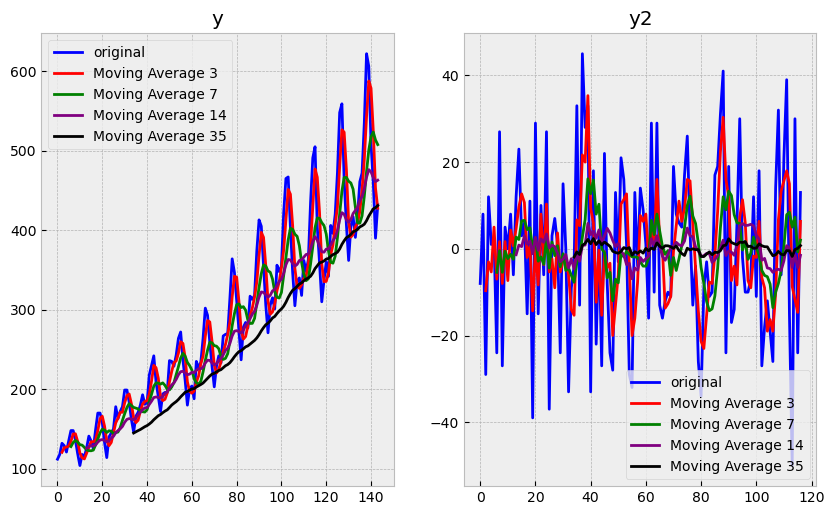

In [11]:
windows = [3,7,14,35]
colors = ['red', 'green', 'purple', 'black']
with plt.style.context('bmh'):
    
    fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(10, 6), dpi=100)
    
    ax1.plot(y, color='blue',label='original')
    for i in range(len(windows)):
        ser1 = moving_average(y, windows[i])
        ax1.plot(ser1, color=colors[i], linewidth='2', label='Moving Average {}'.format(windows[i]))
    ax1.legend()
    ax1.set_title('y')
    
    ax2.plot(y2, color='blue',label='original')
    for i in range(len(windows)):
        ser2 = moving_average(y2, windows[i])
        ax2.plot(ser2, color=colors[i], linewidth='2', label='Moving Average {}'.format(windows[i]))
    ax2.legend()
    ax2.set_title('y2')

In [12]:
# напишем предсказания

def predict(series, N, n_pred):
    new_series = series.copy()
    for _ in range(n_pred):
        new_series = new_series.append(pd.Series([new_series[-N:].mean()]), ignore_index=True)
    return new_series

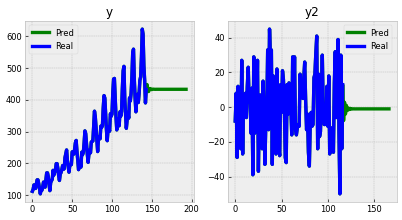

In [13]:
with plt.style.context('bmh'):
    
    fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(8, 4), dpi=60)
    
    series_pred1 = predict(y, 4, 50)
    ax1.plot(series_pred1, color='green', linewidth='4', label='Pred')
    ax1.plot(y, color='blue', linewidth='4', label='Real')
    ax1.legend()
    ax1.set_title('y')
    
    series_pred2 = predict(y2, 4, 50)
    ax2.plot(series_pred2, color='green', linewidth='4', label='Pred')
    ax2.plot(y2, color='blue', linewidth='4', label='Real')
    ax2.legend()
    ax2.set_title('y2')    

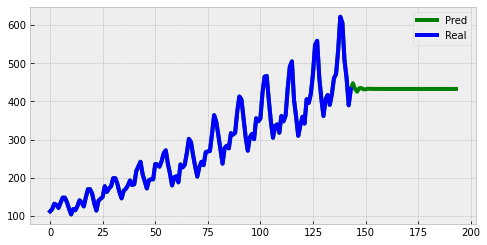

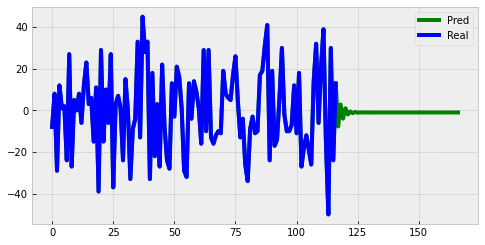

In [14]:
# или так
with plt.style.context('bmh'):
    plt.figure(figsize=(8, 4))
    plt.plot(series_pred1, color='green', linewidth='4', label='Pred')
    plt.plot(y, color='blue', linewidth='4', label='Real')
    plt.legend()
with plt.style.context('bmh'):
    plt.figure(figsize=(8, 4))
    plt.plot(series_pred2, color='green', linewidth='4', label='Pred')
    plt.plot(y2, color='blue', linewidth='4', label='Real')
    plt.legend()

#### Модификацией обычной скользящей средней является взвешенная скользящая средняя

Такая вариация moving average позволяет учитывать временной контекст. Чем раньше было событие - тем меньше оно влияет на прогнозируемое событие

In [15]:
def weighted_moving_average(series, weights):
    n = len(weights)
    if not isinstance(weights, np.ndarray):
        weights = np.array(weights)
    if not isinstance(series, pd.Series):
        series = pd.Series(series)
    wma = series.rolling(n).apply(lambda s: (s * weights).sum() / weights.sum(), raw=True)
    return wma

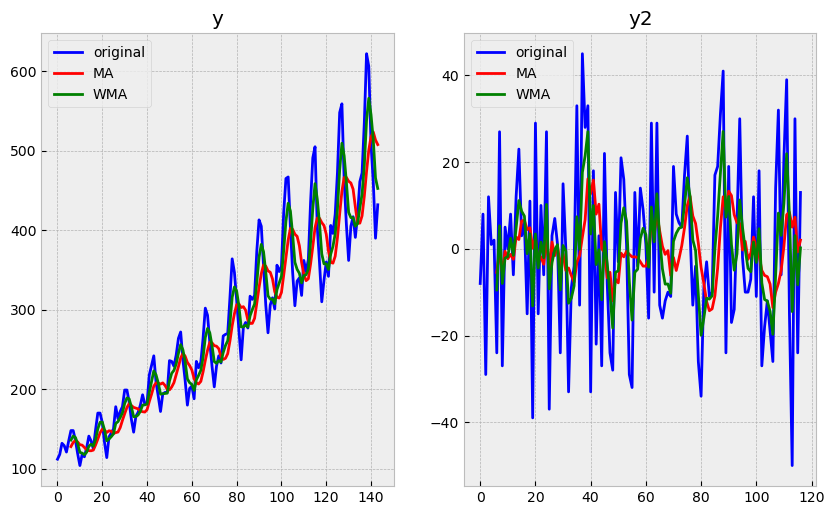

In [16]:
with plt.style.context('bmh'):
    
    fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(10, 6), dpi=100)
    
    wma1 = weighted_moving_average(y, weights = [1,1,2,3,5,8,13])
    ma1 = moving_average(y, 7)
    ax1.plot(y, color='blue',label='original')
    ax1.plot(ma1, color='red', linewidth='2', label='MA')
    ax1.plot(wma1, color='green', linewidth='2', label='WMA')
    ax1.legend()
    ax1.set_title('y')
    
    wma2 = weighted_moving_average(y2, weights = [1,1,2,3,5,8,13])
    ma2 = moving_average(y2, 7)
    ax2.plot(y2, color='blue',label='original')
    ax2.plot(ma2, color='red', linewidth='2', label='MA')
    ax2.plot(wma2, color='green', linewidth='2', label='WMA')
    ax2.legend()
    ax2.set_title('y2') 

#### Экспоненциальное сглаживание EMA

В нем предсказанное значение - это взвешеное срденее между последним наблюдением и предыдущей историей.   
Параметр $\alpha$ называется сглаживающим фактором. Он определяет, как сильно мы будем опираться на историю (чем меньше - тем больше). Чем меньше $\alpha$, тем больше влияния оказывают предыдущие предсказанные значения, и тем сильнее сглаживается ряд.

In [17]:
def exponential_moving_average(series, alpha):
    result = [series[0]]
    for n in range(1, len(series)):
        result.append(alpha * series[n] + (1 - alpha) * result[n-1])
    return pd.Series(result)

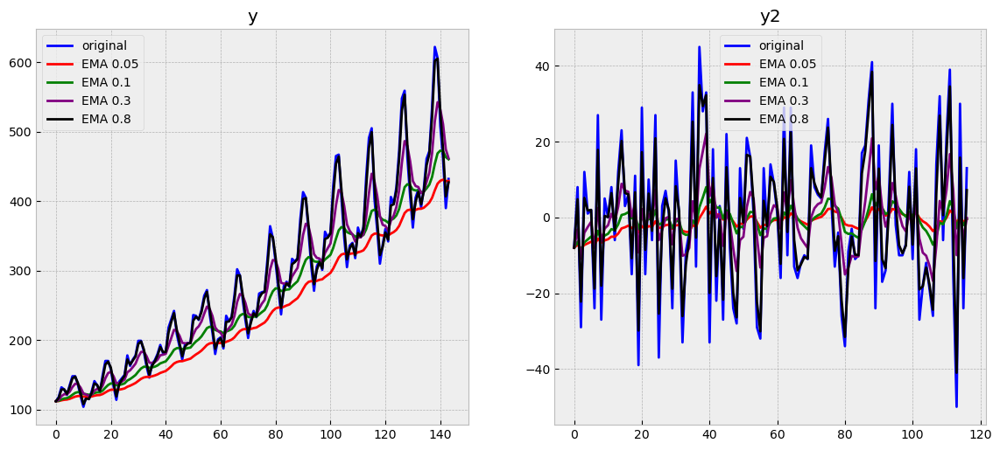

In [18]:
# зависимость от alpha

alphas = [0.05,0.1,0.3,0.8]
colors = ['red', 'green', 'purple', 'black']
    
with plt.style.context('bmh'):
    
    fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(14, 6), dpi=100)
    
    ax1.plot(y, color='blue',label='original')
    for i in range(len(alphas)):
        ser1 = exponential_moving_average(y, alphas[i])
        ax1.plot(ser1, color=colors[i], linewidth='2', label='EMA {}'.format(alphas[i]))
    ax1.legend()
    ax1.set_title('y')
    
    ax2.plot(y2, color='blue',label='original')
    for i in range(len(alphas)):
        ser2 = exponential_moving_average(y2, alphas[i])
        ax2.plot(ser2, color=colors[i], linewidth='2', label='EMA {}'.format(alphas[i]))
    ax2.legend()
    ax2.set_title('y2') 

#### Прогноз на основе EMA

In [19]:
def exponential_moving_average(series, alpha, n_pred=None):
    result = [series[0]]
    for n in range(1, len(series)):
        result.append(alpha * series[n-1] + (1 - alpha) * result[n-1])
    if not n_pred:
        return pd.Series(result)
    
    predictions = [alpha * series[len(series) - 1] + (1 - alpha) * result[-1]]

    for _ in range(n_pred):
        res = alpha * predictions[-1] + (1 - alpha) * result[-1]
        result.append(res)
        predictions.append(res)
    
    return series.append(pd.Series(predictions), ignore_index=True), pd.Series(result)

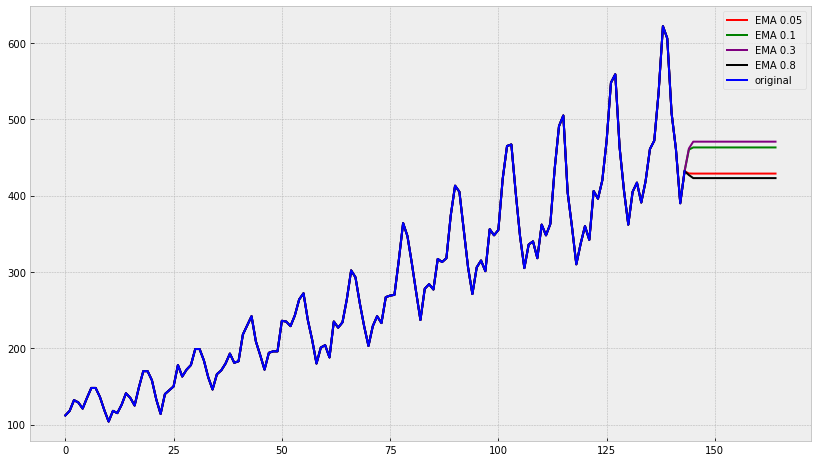

In [20]:
alphas = [0.05,0.1,0.3,0.8]
colors = ['red', 'green', 'purple', 'black']
with plt.style.context('bmh'):
    plt.figure(figsize=(14, 8))
    for i in range(len(alphas)):
        ser, _ = exponential_moving_average(y, alphas[i], 20)
        plt.plot(ser, color=colors[i], linewidth='2', label='EMA {}'.format(alphas[i]))
    plt.plot(y, color='blue',label='original')
    plt.legend()

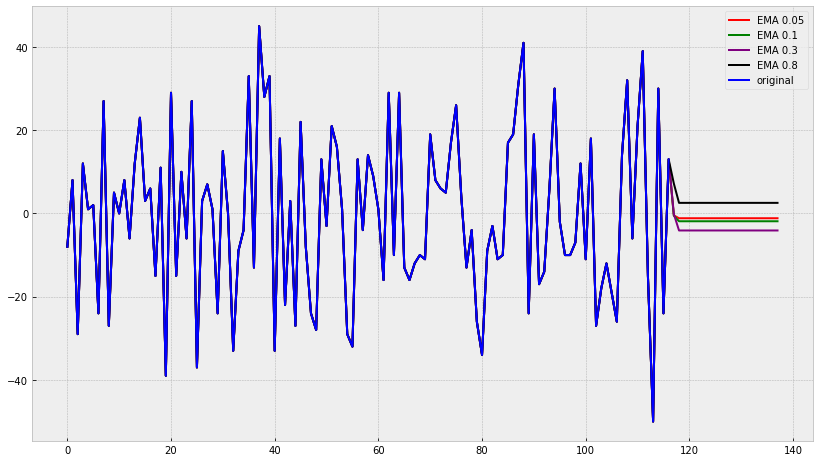

In [21]:
alphas = [0.05,0.1,0.3,0.8]
colors = ['red', 'green', 'purple', 'black']
with plt.style.context('bmh'):
    plt.figure(figsize=(14, 8))
    for i in range(len(alphas)):
        ser, _ = exponential_moving_average(y2, alphas[i], 20)
        plt.plot(ser, color=colors[i], linewidth='2', label='EMA {}'.format(alphas[i]))
    plt.plot(y2, color='blue',label='original')
    plt.legend()

#### Поскольку ВР y имеет тренд, применим к нему  

#### Двойное экспоненциальное сглаживание DOUBLE_EMA

Настройка параметров $\alpha$ и $\beta$ может порой давать самые причудливые результаты.  
$\alpha$ отвечает за сглаживание ряда вокруг тренда, $\beta$ - за сглаживание самого тренда.  
Чем больше значения, тем более значимыми будут последние наблюдения и менее значимой будет история.

In [22]:
def double_ema(series, alpha, beta):
    result = [series[0]]
    level, trend = series[0], series[1] - series[0]
    for n in range(1, len(series)):
        value = series[n]
        last_level, level = level, alpha*value + (1-alpha)*(level+trend)
        trend = beta*(level-last_level) + (1-beta)*trend
        result.append(level+trend)
    return pd.Series(result)

In [23]:
def plot_dema_y(alpha, beta):
    dema = double_ema(y, alpha, beta)
    with plt.style.context('bmh'):
        plt.figure(figsize=(14, 8))
        plt.plot(y, color='blue',label='original')
        plt.plot(dema, color='red', linewidth='4', label='DEMA')
        plt.title("alpha={}, beta={}".format(alpha, beta))
        plt.legend()

In [24]:
def plot_dema_y2(alpha, beta):
    dema = double_ema(y2, alpha, beta)
    with plt.style.context('bmh'):
        plt.figure(figsize=(14, 8))
        plt.plot(y2, color='blue',label='original')
        plt.plot(dema, color='red', linewidth='4', label='DEMA')
        plt.title("alpha={}, beta={}".format(alpha, beta))
        plt.legend()

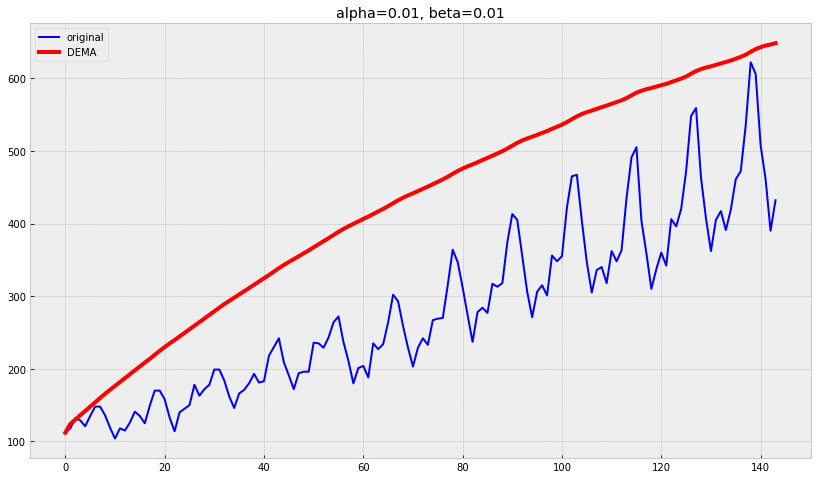

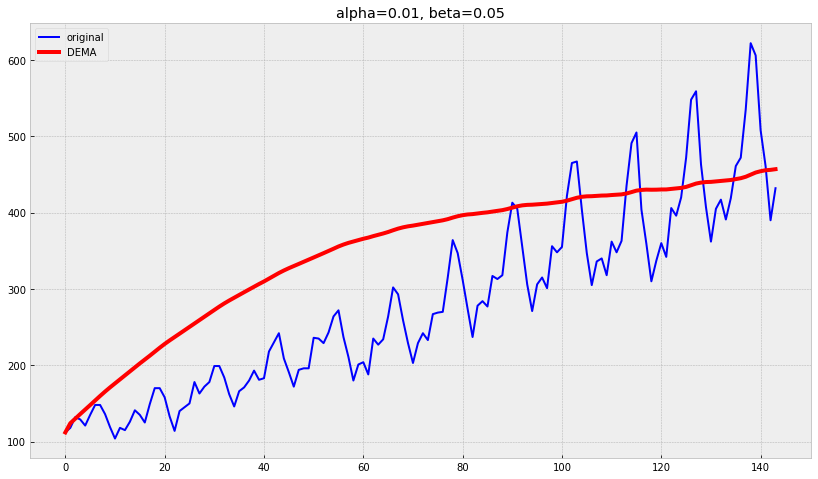

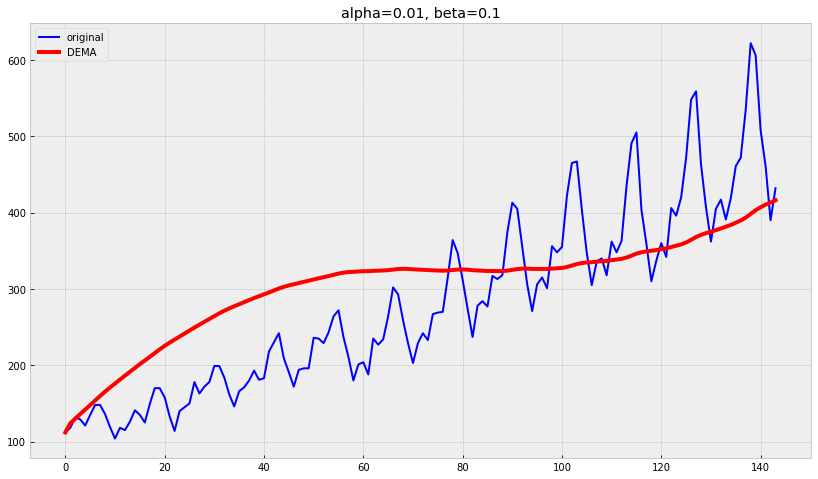

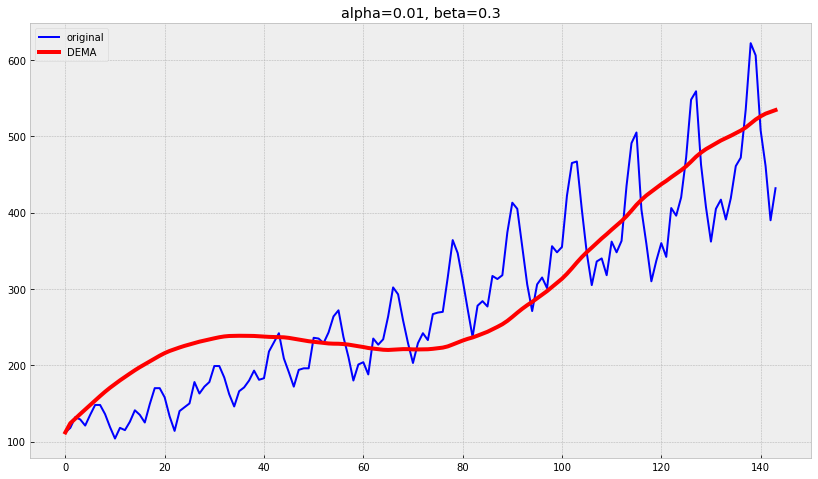

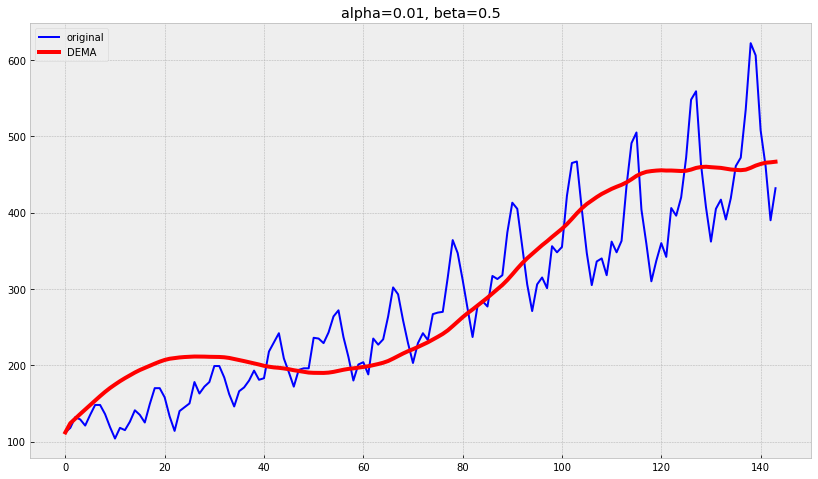

...

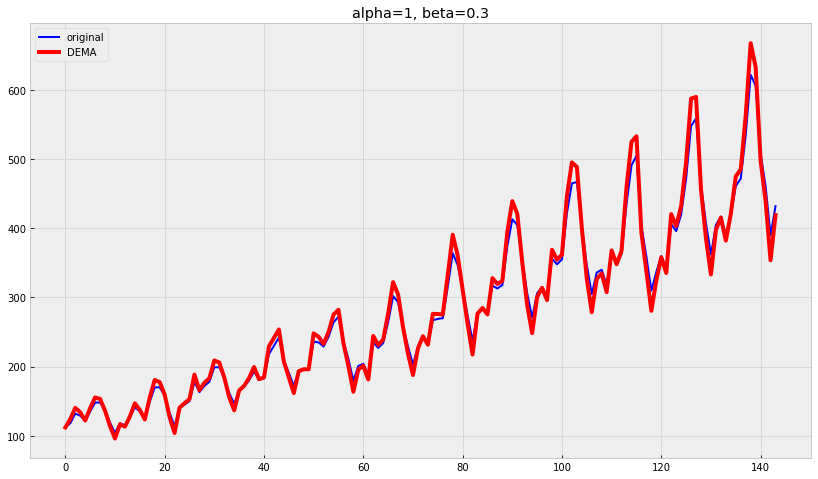

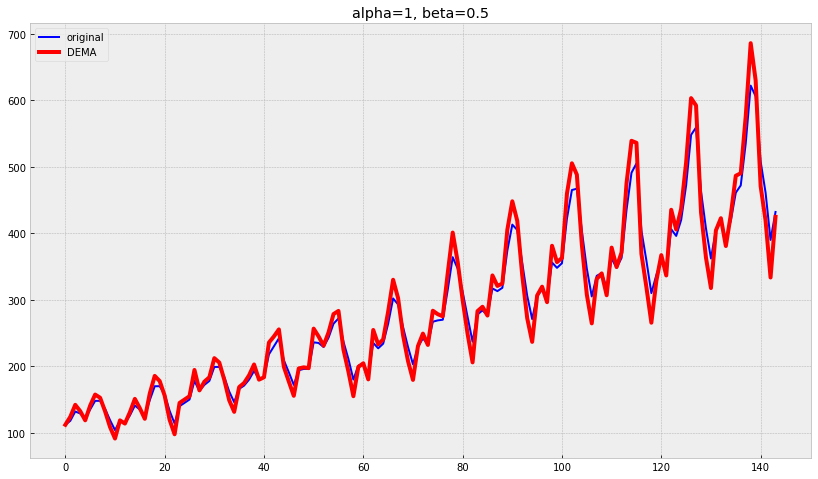

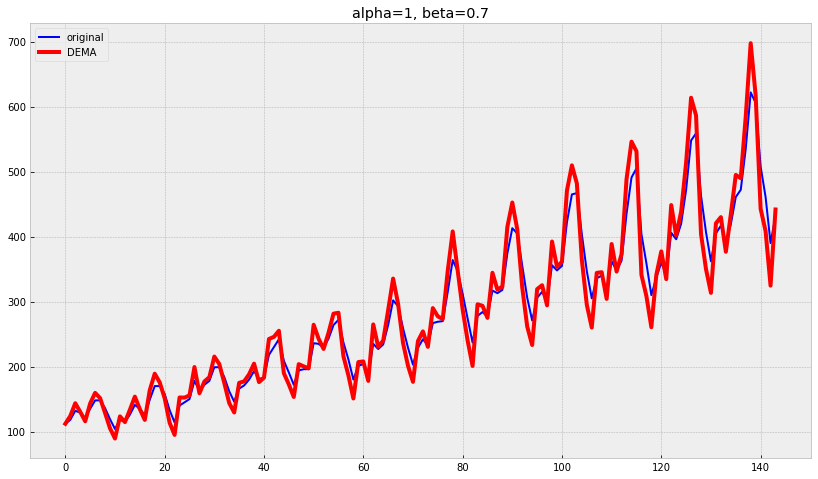

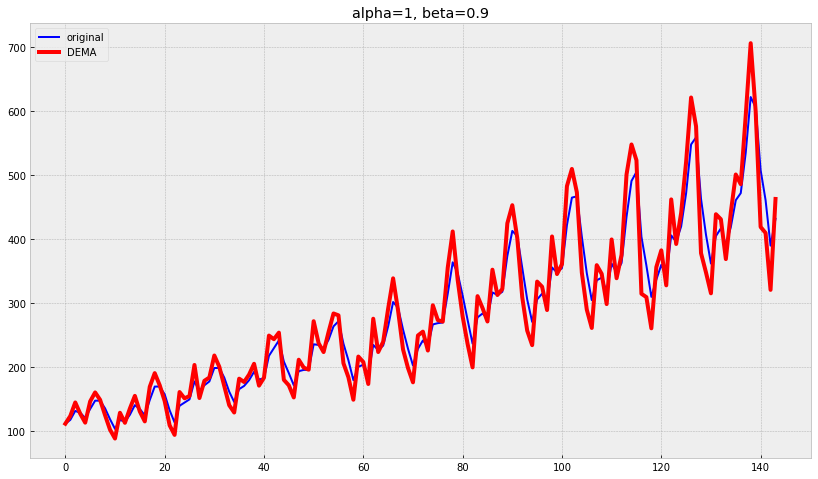

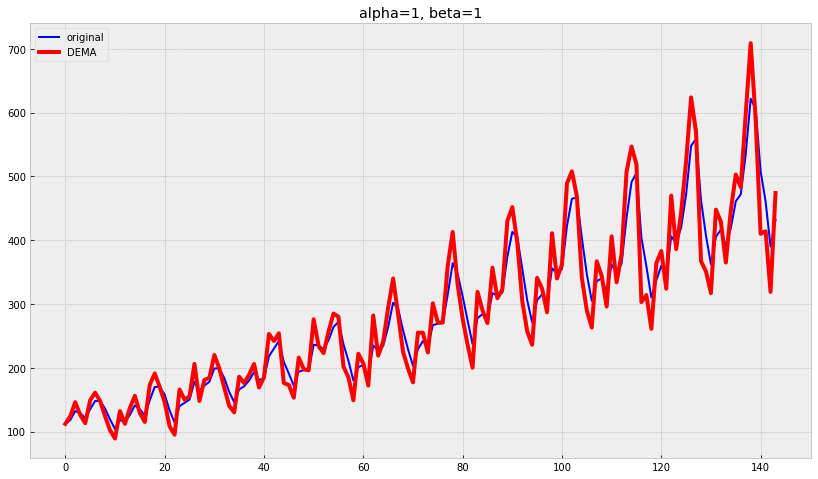

In [25]:
alpha, beta = [0.01, 0.05, 0.1, 0.3, 0.5, 0.7, 0.9, 1], [0.01, 0.05, 0.1, 0.3, 0.5, 0.7, 0.9, 1]

for a in alpha:
    for b in beta:
        plot_dema_y(a, b)        

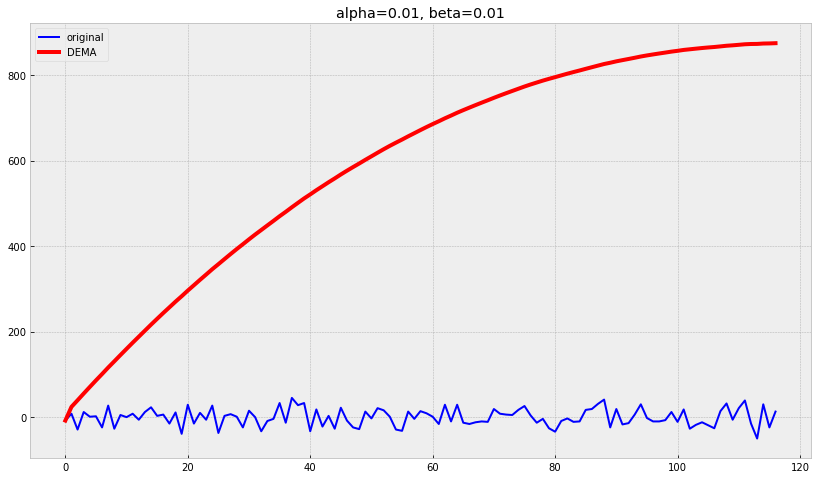

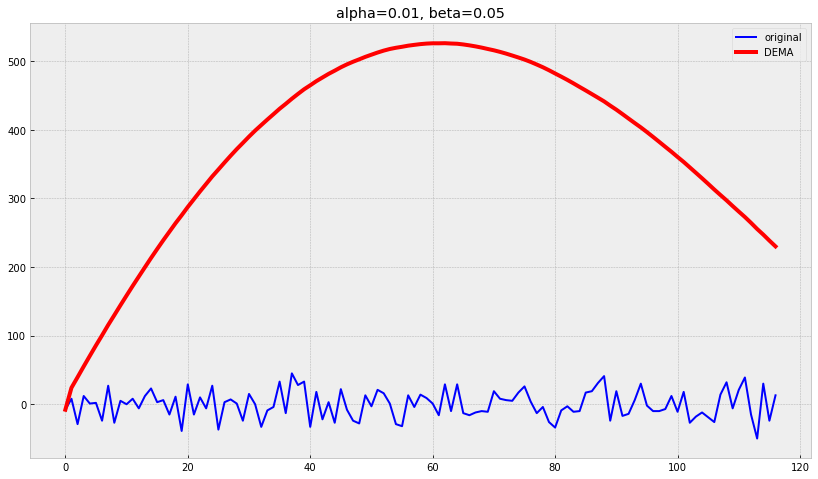

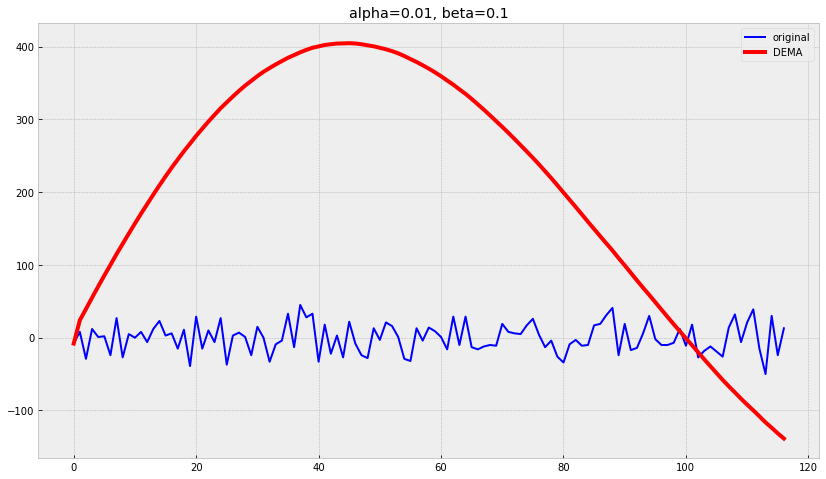

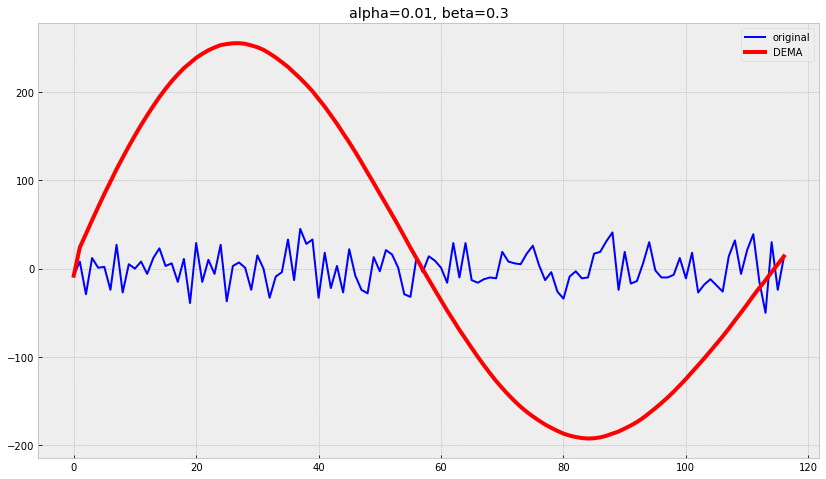

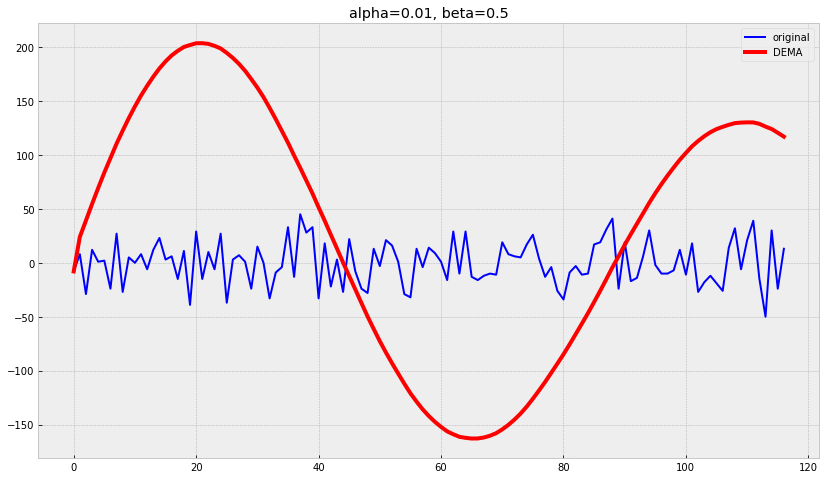

...

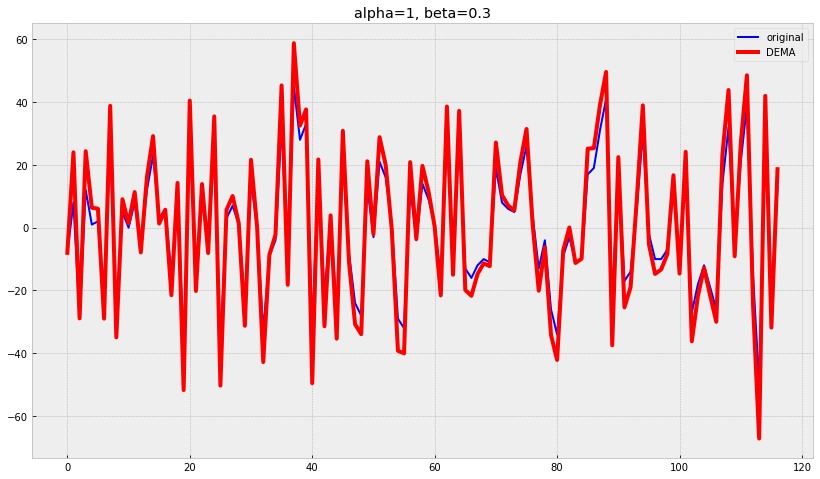

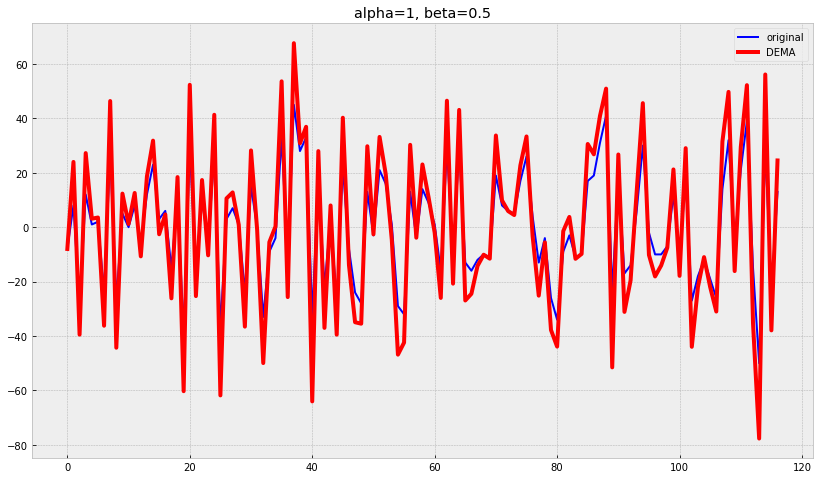

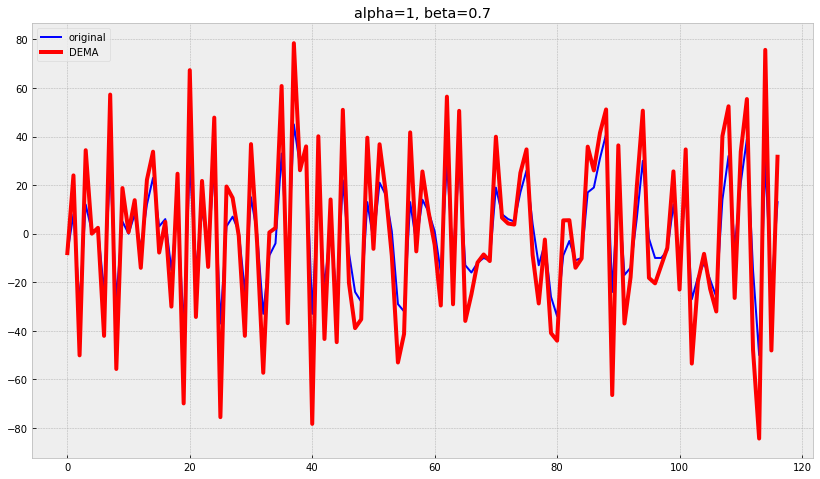

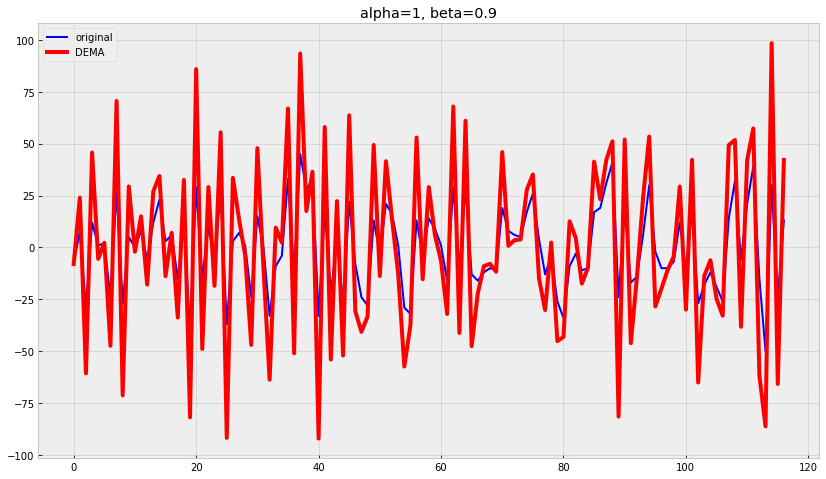

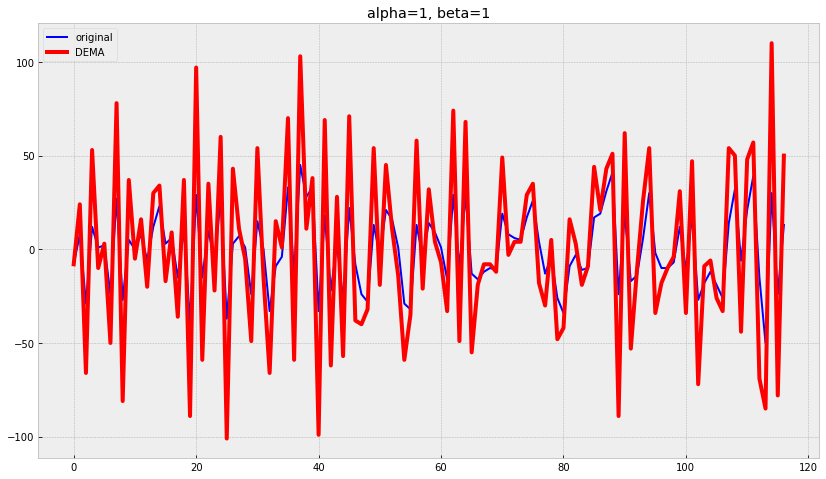

In [26]:
for a in alpha:
    for b in beta:
        plot_dema_y2(a, b) 

#### Прогноз на основе DOUBLE_EMA

In [27]:
def double_ema_with_preds(series, alpha, beta, n_preds):
    result = [series[0]]
    level, trend = series[0], series[1] - series[0]
    for n in range(1, len(series)):
        value = series[n]
        last_level, level = level, alpha*value + (1-alpha)*(level+trend)
        trend = beta*(level-last_level) + (1-beta)*trend
        result.append(level+trend)
        
    preds = []
    for n in range(n_preds):
        value = result[-1]
        last_level, level = level, alpha*value + (1-alpha)*(level+trend)
        trend = beta*(level-last_level) + (1-beta)*trend
        result.append(level+trend)
        preds.append(level+trend)

    return series.append(pd.Series(preds), ignore_index=True), pd.Series(result)

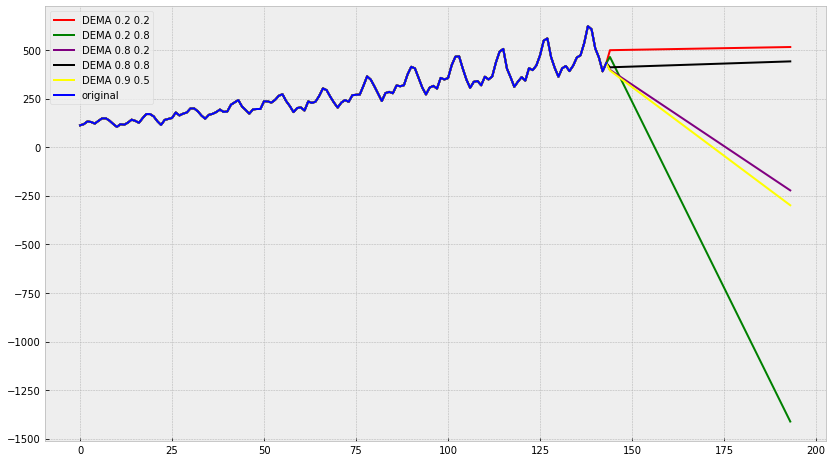

In [28]:
alphas = [0.2,0.2,0.8,0.8, 0.9]
bettas = [0.2,0.8,0.2,0.8, 0.5]
colors = ['red', 'green', 'purple', 'black', 'yellow']
with plt.style.context('bmh'):
    plt.figure(figsize=(14, 8))
    for i in range(len(alphas)):
        ser, _ = double_ema_with_preds(y, alphas[i], bettas[i], 50)
        plt.plot(ser, color=colors[i], linewidth='2', label='DEMA {} {}'.format(alphas[i], bettas[i]))
    plt.plot(y, color='blue',label='original')
    plt.legend()

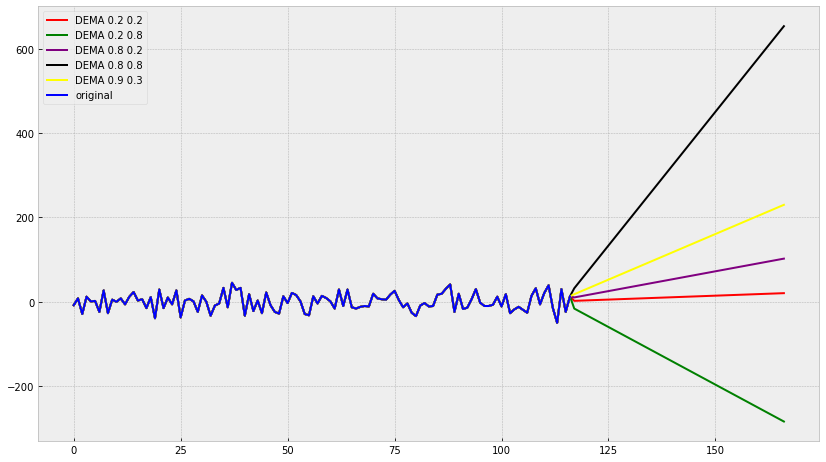

In [29]:
alphas = [0.2,0.2,0.8,0.8, 0.9]
bettas = [0.2,0.8,0.2,0.8, 0.3]
colors = ['red', 'green', 'purple', 'black', 'yellow']
with plt.style.context('bmh'):
    plt.figure(figsize=(14, 8))
    for i in range(len(alphas)):
        ser, _ = double_ema_with_preds(y2, alphas[i], bettas[i], 50)
        plt.plot(ser, color=colors[i], linewidth='2', label='DEMA {} {}'.format(alphas[i], bettas[i]))
    plt.plot(y2, color='blue',label='original')
    plt.legend()

#### Хольт-Винтерс

Важно - метод применим только в случае сезонности. Если ее нет - метод Хольта-Винтерса не даст хороших результатов

In [30]:
def initial_trend(series, season_len):
    return sum([float(series[i + season_len] - series[i]) / season_len]) / season_len

In [31]:
def initial_seasonal_components(series, slen):
    seasonals = {}
    season_averages = []
    n_seasons = int(len(series)/slen)
    # compute season averages
    for j in range(n_seasons):
        season_averages.append(sum(series[slen*j:slen*j+slen])/float(slen))
    # compute initial values
    for i in range(slen):
        sum_of_vals_over_avg = 0.0
        for j in range(n_seasons):
            sum_of_vals_over_avg += series[slen*j+i]-season_averages[j]
        seasonals[i] = sum_of_vals_over_avg/n_seasons
    return seasonals

In [32]:
def triple_exponential_smoothing(series, slen, alpha, beta, gamma, n_preds):
    result = []
    seasonals = initial_seasonal_components(series, slen)
    for i in range(len(series)+n_preds):
        if i == 0: # initial values
            smooth = series[0]
            trend = initial_trend(series, slen)
            result.append(series[0])
            continue
        if i >= len(series): # we are forecasting
            m = i - len(series) + 1
            result.append((smooth + m*trend) + seasonals[i%slen])
        else:
            val = series[i]
            last_smooth, smooth = smooth, alpha*(val-seasonals[i%slen]) + (1-alpha)*(smooth+trend)
            trend = beta * (smooth-last_smooth) + (1-beta)*trend
            seasonals[i%slen] = gamma*(val-smooth) + (1-gamma)*seasonals[i%slen]
            result.append(smooth+trend+seasonals[i%slen])
    return result

In [33]:
def plot_tema_y(alpha, beta, gamma, ser=y, ser_to_plot=y, n_preds=24):
    tema = triple_exponential_smoothing(ser, 12, alpha, beta, gamma, n_preds)
    with plt.style.context('bmh'):
        plt.figure(figsize=(14, 8))
        plt.plot(ser_to_plot, color='blue',label='original')
        plt.plot(tema, color='red', linewidth='4', label='TEMA')
        plt.title("alpha={}, beta={}, gamma={}".format(alpha, beta, gamma))
        plt.legend()

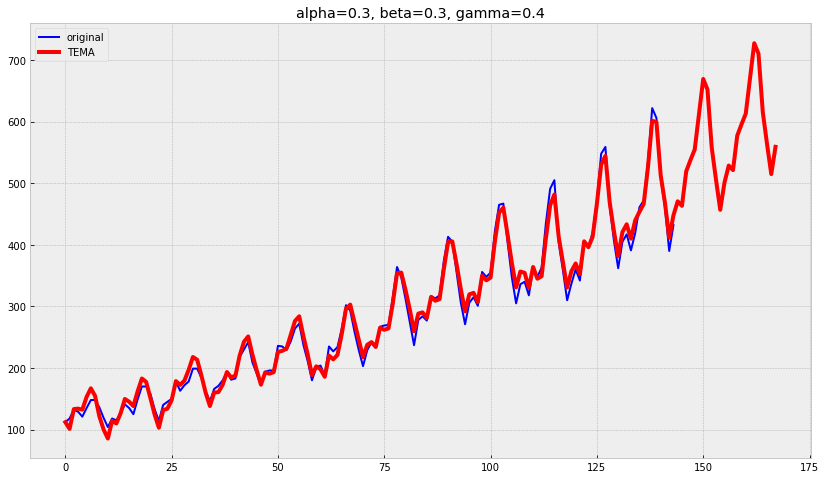

In [34]:
plot_tema_y(0.3, 0.3, 0.4)

Посмотрим, как поведет себя ВР y2. По идее должны быть хуже результаты, т.к. ВР без видимой сезонности

In [35]:
def plot_tema_y2(alpha, beta, gamma, ser=y2, ser_to_plot=y2, n_preds=24):
    tema = triple_exponential_smoothing(ser, 12, alpha, beta, gamma, n_preds)
    with plt.style.context('bmh'):
        plt.figure(figsize=(14, 8))
        plt.plot(ser_to_plot, color='blue',label='original')
        plt.plot(tema, color='red', linewidth='4', label='TEMA')
        plt.title("alpha={}, beta={}, gamma={}".format(alpha, beta, gamma))
        plt.legend()

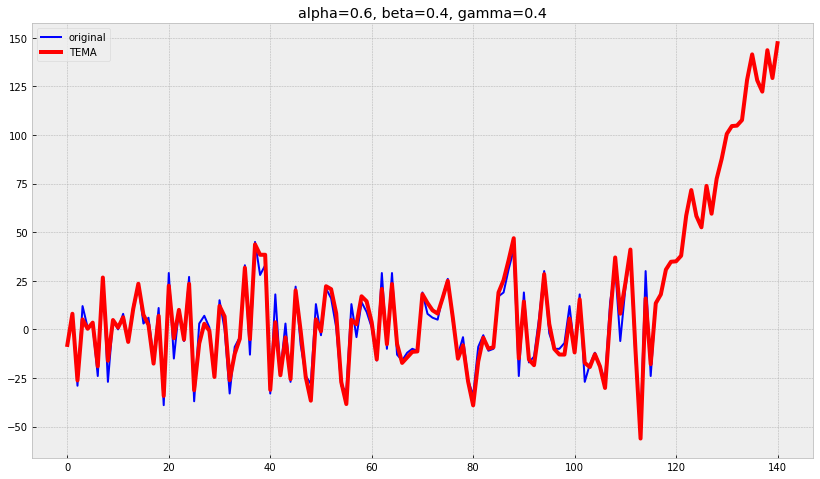

In [36]:
plot_tema_y2(0.6, 0.4, 0.4)

#### Подбор параметров

In [37]:
from scipy.optimize import minimize
from sklearn.metrics import mean_squared_error

In [38]:
series = y
series2 = y2
slen = 12

In [39]:
train, test, val = series[:90], series[90:100], series[100:]
train2, test2, val2 = series2[:60], series2[60:70], series2[70:]

In [40]:
def mse_tema(X):
    alpha, beta, gamma = X
    result = triple_exponential_smoothing(train, slen, alpha, beta, gamma, len(test))
    predictions = result[-len(test):]
    error = mean_squared_error(predictions, test)
    return error

def mse_dema(X):
    alpha, beta = X
    result = double_ema(train, alpha, beta)
    predictions = result[-len(test):]
    error = mean_squared_error(predictions, test)
    return error

def mse2_tema(X):
    alpha, beta, gamma = X
    result = triple_exponential_smoothing(train2, slen, alpha, beta, gamma, len(test2))
    predictions = result[-len(test2):]
    error = mean_squared_error(predictions, test2)
    return error

def mse2_dema(X):
    alpha, beta = X
    result = double_ema(train2, alpha, beta)
    predictions = result[-len(test2):]
    error = mean_squared_error(predictions, test2)
    return error

In [41]:
opt_tema = minimize(mse_tema, x0=[0,0,0], method="L-BFGS-B", bounds = ((0, 1), (0, 1), (0, 1)))
opt2_tema = minimize(mse2_tema, x0=[0,0,0], method="L-BFGS-B", bounds = ((0, 1), (0, 1), (0, 1)))

opt_dema = minimize(mse_dema, x0=[0,0], method="Nelder-Mead", bounds = ((0, 1), (0, 1)))
opt2_dema = minimize(mse2_dema, x0=[0,0], method="Nelder-Mead", bounds = ((0, 1), (0, 1)))

In [42]:
alpha_opt, beta_opt, gamma_opt = opt_tema.x
print(opt_tema)

      fun: 74.46863869446352
 hess_inv: <3x3 LbfgsInvHessProduct with dtype=float64>
      jac: array([ 1.98951966e-04,  2.27373675e-04, -1.11599925e+02])
  message: b'CONVERGENCE: REL_REDUCTION_OF_F_<=_FACTR*EPSMCH'
     nfev: 116
      nit: 18
     njev: 29
   status: 0
  success: True
        x: array([0.21120402, 0.03194377, 1.        ])


In [43]:
alpha_opt, beta_opt, gamma_opt = opt2_tema.x
print(opt2_tema)

      fun: 304.65692980323405
 hess_inv: <3x3 LbfgsInvHessProduct with dtype=float64>
      jac: array([-1.70530257e-05,  4.46345155e+01,  3.18590310e+00])
  message: b'CONVERGENCE: REL_REDUCTION_OF_F_<=_FACTR*EPSMCH'
     nfev: 64
      nit: 10
     njev: 16
   status: 0
  success: True
        x: array([0.01306996, 0.        , 0.        ])


In [44]:
alpha_opt, beta_opt = opt_dema.x
print(opt_dema)

 final_simplex: (array([[ 0.33500375, -0.01321948],
       [ 0.33493967, -0.01321989],
       [ 0.33507106, -0.01322667]]), array([1414.51534001, 1414.51535421, 1414.51535586]))
           fun: 1414.5153400115967
       message: 'Optimization terminated successfully.'
          nfev: 101
           nit: 55
        status: 0
       success: True
             x: array([ 0.33500375, -0.01321948])


In [45]:
alpha_opt, beta_opt = opt2_dema.x
print(opt2_dema)

 final_simplex: (array([[0.08064352, 0.06171851],
       [0.0806095 , 0.06171168],
       [0.08068316, 0.06169777]]), array([233.75455209, 233.75457304, 233.75460598]))
           fun: 233.75455209244916
       message: 'Optimization terminated successfully.'
          nfev: 114
           nit: 59
        status: 0
       success: True
             x: array([0.08064352, 0.06171851])


Кросс-валидация

In [46]:
train, val = series[:75], series[75:]

In [47]:
from sklearn.model_selection import TimeSeriesSplit

def mse_cross_val(X):
    alpha, beta, gamma = X
    split = TimeSeriesSplit(n_splits=3) 
    errors = []
    
    for train_split, test_split in split.split(train):
        train_split_ts = train.iloc[train_split]
        test_split_ts = train.iloc[test_split]
#         print(train_split_ts)
#         print(test_split_ts)
        result = triple_exponential_smoothing(train_split_ts, 12, alpha, beta, gamma, len(test_split))
        predictions = result[-len(test_split_ts):]
        error = mean_squared_error(predictions, test_split_ts)
        errors.append(error)
    print(f'{np.mean(np.array(errors))}------------')
    return np.mean(np.array(errors))

In [48]:
opt = minimize(mse_cross_val, x0=[0,0,0], method="Nelder-Mead", bounds = ((0, 1), (0, 1), (0, 1)))
# opt = minimize(mse_cross_val, x0=[0,0,0], method="L-BFGS-B", bounds = ((0, 1), (0, 1), (0, 1)))

9848.154299554233------------
9755.110332679471------------
9848.154299554233------------
9840.591330652322------------
9781.38951831006------------
9737.010859720713------------
9682.43746623897------------
9640.77052063861------------
9544.357152514012------------
9539.969605218073------------
9422.460944479802------------
9352.25626588136------------
9164.781216527996------------
9085.294284747135------------
8814.385734441888------------
8740.930515431546------------
8385.962105557772------------
8228.16096158798------------
7758.864035724672------------
7579.05035601327------------
6998.450876512482------------
6820.03691021093------------
6204.290876556697------------
6031.694092067534------------
5538.564397860761------------
5308.5728687624605------------
5006.595984949092------------
5118.613556387222------------
5439.478298277202------------
5771.120101482767------------
5163.815537761816------------
5576.747375549708------------
5169.377176816324------------
5199.29209338801

In [49]:
alpha_opt, beta_opt, gamma_opt = opt.x
print(opt)

 final_simplex: (array([[ 0.7365034 ,  0.12663802, -0.08244164],
       [ 0.73649065,  0.12663784, -0.08239921],
       [ 0.73650386,  0.12663865, -0.08236551],
       [ 0.73647979,  0.12664516, -0.08239159]]), array([154.30642188, 154.30642192, 154.30642192, 154.30642206]))
           fun: 154.30642188203717
       message: 'Optimization terminated successfully.'
          nfev: 278
           nit: 157
        status: 0
       success: True
             x: array([ 0.7365034 ,  0.12663802, -0.08244164])


для ВР y2

In [50]:
train, val = series2[:65], series2[65:]

In [51]:
opt2 = minimize(mse_cross_val, x0=[0,0,0], method="Nelder-Mead", bounds = ((0, 1), (0, 1), (0, 1)))

710.5959764017495------------
709.8543768463079------------
710.5959764017495------------
710.5342757601096------------
710.0627503483744------------
709.7093393053447------------
709.2761468836138------------
708.9482750993252------------
708.1899365086737------------
708.1543062967262------------
707.234945030279------------
706.6895830412312------------
705.2447488397629------------
704.63832347749------------
702.594302717659------------
702.0425345667378------------
699.4353895651866------------
698.3126767680109------------
695.047995358707------------
693.816693932284------------
690.0631720243113------------
688.9813981195726------------
685.509678771401------------
684.7361484899899------------
682.9767431220121------------
682.0756986947474------------
683.0045455676042------------
683.2940049020948------------
685.9221507542394------------
682.9597756832451------------
686.3025110291072------------
682.5033481277968------------
681.7683577590922------------
681.2937501634289

In [52]:
alpha_opt, beta_opt, gamma_opt = opt2.x
print(opt2)

 final_simplex: (array([[ 0.02827878,  0.03081858, -0.00675631],
       [ 0.02824887,  0.03084957, -0.00672689],
       [ 0.02828488,  0.03079193, -0.00683926],
       [ 0.02827158,  0.03080242, -0.00673821]]), array([668.97963808, 668.97963813, 668.97963824, 668.97963878]))
           fun: 668.9796380827148
       message: 'Optimization terminated successfully.'
          nfev: 132
           nit: 72
        status: 0
       success: True
             x: array([ 0.02827878,  0.03081858, -0.00675631])


Итого получаем, что:
    * ВР y (нестационарный ряд) имеет тренд и сезонность - его лучше обработать методом Хольта-Винтерса.
    * ВР y2 (приближенно стационарный ряд) не имеет тренда, видимой сезонности - его лучше обработать EMA
    
Хотя на графиках у ВР y2 метод Хольта-Винтерса тоже неплохо получается. Может, все же есть сезон неявный



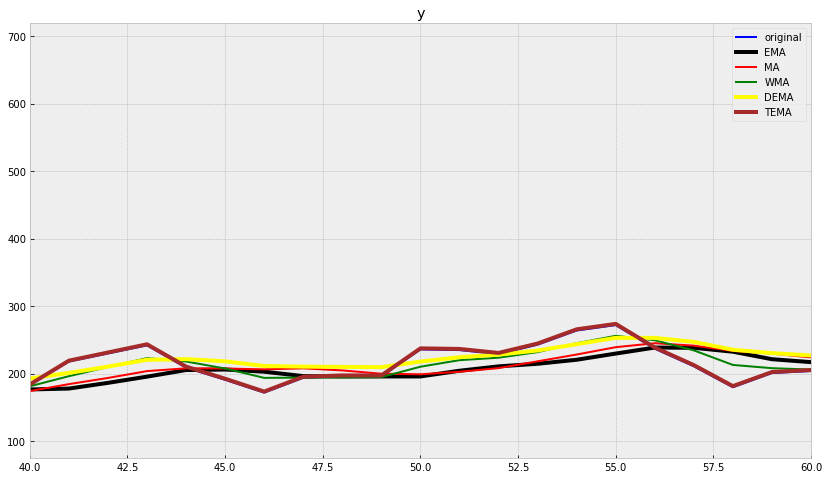

In [53]:
alpha = 0.21120402   # параметры берем из подбора
betta = 0.03194377
gamma = 1
n_preds = 20
slen = 12      # период сезонности
    
with plt.style.context('bmh'):
    plt.figure(figsize=(14, 8))
        
    tema1 = triple_exponential_smoothing(y, slen, alpha, betta, gamma, n_preds)
    dema1 = double_ema(y, alpha, betta)
    ema1 = exponential_moving_average(y, alpha)
    wma1 = weighted_moving_average(y, weights = [1,1,2,3,5,8,13])
    ma1 = moving_average(y, 7)
    plt.plot(y, color='blue',label='original')
    plt.plot(ema1, color='black', linewidth='4', label='EMA')
    plt.plot(ma1, color='red', linewidth='2', label='MA')
    plt.plot(wma1, color='green', linewidth='2', label='WMA')
    plt.plot(dema1, color='yellow', linewidth='4', label='DEMA')
    plt.plot(tema1, color='brown', linewidth='4', label='TEMA')
    plt.xlim(40, 60)
    plt.legend()
    plt.title('y')

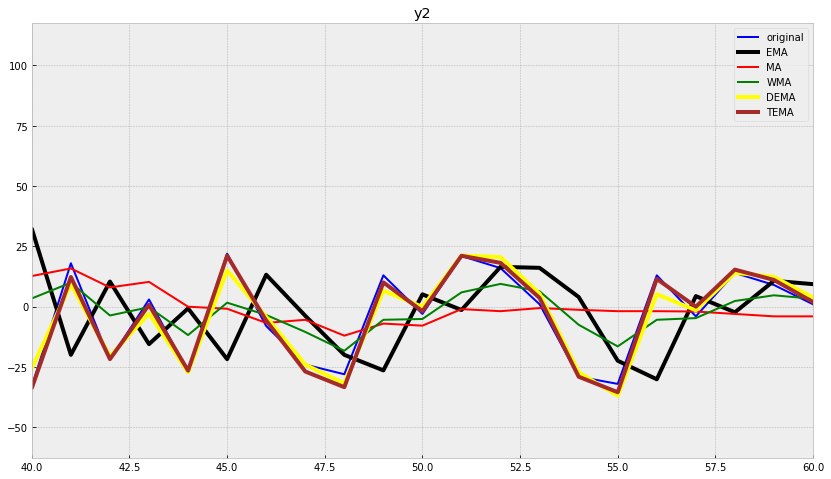

In [54]:
alpha = 0.8   # параметры из подбора хуже
betta = 0.2
gamma = 0.4
n_preds = 20
slen = 12      # период сезонности
    
with plt.style.context('bmh'):
    plt.figure(figsize=(14, 8))
    
    tema2 = triple_exponential_smoothing(y2, slen, alpha, betta, gamma, n_preds)
    dema2 = double_ema(y2, alpha, betta)
    ema2 = exponential_moving_average(y2, alpha)
    wma2 = weighted_moving_average(y2, weights = [1,1,2,3,5,8,13])
    ma2 = moving_average(y2, 7)
    plt.plot(y2, color='blue',label='original')
    plt.plot(ema2, color='black', linewidth='4', label='EMA')
    plt.plot(ma2, color='red', linewidth='2', label='MA')
    plt.plot(wma2, color='green', linewidth='2', label='WMA')
    plt.plot(dema2, color='yellow', linewidth='4', label='DEMA')
    plt.plot(tema2, color='brown', linewidth='4', label='TEMA')
    plt.xlim(40, 60)
    plt.legend()
    plt.title('y2') 